# The Study of temporal examining factors influence on income inequality

Regional income inequality represents a critical challenge within the domain of social science, influenced by a lot of factors. This study embarks on an initial investigation with the relationship between the Gini index(a measure of income distribution within a population) and several determinants over a decade (2012-2021). These determinants include population, education levels, and racial composition. Through this exploration, the research aims to contribute to a deeper understanding of how these variables interact with income inequality.

# 01.The Brief Summary of the Topic

>This study aims to explore the distribution phenomenon of income inequality in various geographical regions of California State. And exploring the correlation between several factors such as demographic characteristics with income inequality. The API allowing me to fetch the American Community Survey (ACS) five-year data from the 2012-2021 , with census tracts as the smallest unit of analysis.

# 02.Access the Datasets by API

### Import the required libraries

In [1]:
# import fundamental libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
import os

# import census API
from census import Census
from us import states

pd.set_option('display.max_columns', None)
pd.set_option('display.float_format', '{:.2f}'.format)

### Create a function to get the data from the census API

In [2]:
# read the API key
import json
with open("C:/Users/Admin/Desktop/UCB_CYPLAN255_2024/notebooks/data/census_api_key_Yanyao.json", 'r') as f:
    key_file = f.read()
my_api_key = json.loads(key_file)['key']


def fetch_census_data(fields, years):
    """
    Fetches census data for the specified fields and years for all counties and tracts in California.

    Parameters:
    - api_key: str, Census API key.
    - fields: list of str, the specific columns to retrieve.
    - years: list of int, the years for which to retrieve the data.

    Returns:
    - DataFrame containing the requested data along with the year of the data.
    """
    
    c = Census(my_api_key)
    all_year_data = pd.DataFrame()
    
    for year in years:
        data = c.acs5.state_county_tract(fields=fields,
                                         state_fips=states.CA.fips,  # Fetch the fips code for California
                                         county_fips="*",  # fetch all the counties
                                         tract="*",  # fetch all the tracts
                                         year=year)
        
        # transform the data into a DataFrame
        df = pd.DataFrame(data)
        
        # add a new columns to store the year
        df['year'] = year
        
        # concatenate the data
        all_year_data = pd.concat([all_year_data, df], ignore_index=True)
    
    return all_year_data

### Fetch Reponsing Variable  
>The Gini Index, a widely used metric for assessing income inequality ***(Farris,F.A,2010)***, provides valuable insights into the socioeconomic disparities within a population. At the Census Tract level, a more granular examination of these disparities becomes possible, making it an essential tool for understanding localized inequalities. ACS has published the table ***[B19083(Gini Index of income inequality)](https://data.census.gov/table?q=B19083:%20Gini%20Index%20of%20Income%20Inequality&g=010XX00US$1400000)*** from 2010-2021, and you can click the link to review it.

- Farris, F. A. (2010). The Gini index and measures of inequality. The American Mathematical Monthly, 117(10), 851-864.

In [3]:
fields = ['NAME', 'B19083_001E'] # 'B19083_001E': gini index estimate
years = list(range(2012, 2022))

# fetch the data by calling the function
acs_ca_gini = fetch_census_data(fields, years)
acs_ca_gini['GEO_ID'] = acs_ca_gini['state'] + acs_ca_gini['county'] + acs_ca_gini['tract']
acs_ca_gini = acs_ca_gini.rename(columns={'B19083_001E': 'gini_index'})
acs_ca_gini.info()
acs_ca_gini

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 82714 entries, 0 to 82713
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   NAME        82714 non-null  object 
 1   gini_index  82714 non-null  float64
 2   state       82714 non-null  object 
 3   county      82714 non-null  object 
 4   tract       82714 non-null  object 
 5   year        82714 non-null  int64  
 6   GEO_ID      82714 non-null  object 
dtypes: float64(1), int64(1), object(5)
memory usage: 4.4+ MB


,NAME,gini_index,state,county,tract,year,GEO_ID
0,"Census Tract 198.09, San Diego County, California",0.42,06,073,019809,2012,06073019809
1,"Census Tract 200.26, San Diego County, California",0.39,06,073,020026,2012,06073020026
2,"Census Tract 200.27, San Diego County, California",0.49,06,073,020027,2012,06073020027
3,"Census Tract 170.56, San Diego County, California",0.34,06,073,017056,2012,06073017056
4,"Census Tract 186.14, San Diego County, California",0.40,06,073,018614,2012,06073018614
...,...,...,...,...,...,...,...
82709,"Census Tract 409.02, Yuba County, California",0.42,06,115,040902,2021,06115040902
82710,"Census Tract 410.01, Yuba County, California",0.47,06,115,041001,2021,06115041001
82711,"Census Tract 410.02, Yuba County, California",0.41,06,115,041002,2021,06115041002
82712,"Census Tract 411.01, Yuba County, California",0.41,06,115,041101,2021,06115041101


In [4]:
# acs_ca_gini.to_csv('acs_ca_gini.csv',index=False)

### Fetch Explaintory Variable  
>I review several literatures and find several factors maybe have correlation with regional income disparities as shown below,   
>- racial characteristics,***[B02001(Race)](https://data.census.gov/table?q=B02001&g=010XX00US$1400000)***
>- education level,***[B15003(Educational Attainment for the Population 25 Years and Over)](https://data.census.gov/table?q=B15003&g=010XX00US$1400000)***
>>- Hendel, I., Shapiro, J., & Willen, P. (2005). Educational op-portunity and income inequality. Journal of Public Economics, 89(5-6), 841-870.
>>- Bailey, S. R., Saperstein, A., & Penner, A. M. (2014). Race, color, and income inequality across the Americas. Demographic Research, 31, 735-756.

#### Racial Data

In [5]:
fields = ['NAME', 'B02001_001E','B02001_002E','B02001_003E','B02001_004E', 'B02001_005E','B02001_006E'] # 'B02001_001E': Total pop, 'B02001_002E': White alone, 'B02001_003E': Black or African American alone, 'B02001_004E': American Indian and Alaska Native alone,'B02001_005E': Asian alone,'B02001_006E': Native Hawaiian and Other Pacific Islander alone
years = list(range(2012, 2022))

# fetch the data by calling the function
acs_ca_demo = fetch_census_data(fields, years)
acs_ca_demo['GEO_ID'] = acs_ca_demo['state'] + acs_ca_demo['county'] + acs_ca_demo['tract']
acs_ca_demo = acs_ca_demo.rename(columns={'B02001_001E': 'total_pop', 'B02001_002E': 'white_alone', 'B02001_003E': 'black_alone', 'B02001_004E': 'ameri_ind', 'B02001_005E': 'asian_alone', 'B02001_006E': 'hawai_paci_alone'})
acs_ca_demo.info()
acs_ca_demo

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 82714 entries, 0 to 82713
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   NAME              82714 non-null  object 
 1   total_pop         82714 non-null  float64
 2   white_alone       82714 non-null  float64
 3   black_alone       82714 non-null  float64
 4   ameri_ind         82714 non-null  float64
 5   asian_alone       82714 non-null  float64
 6   hawai_paci_alone  82714 non-null  float64
 7   state             82714 non-null  object 
 8   county            82714 non-null  object 
 9   tract             82714 non-null  object 
 10  year              82714 non-null  int64  
 11  GEO_ID            82714 non-null  object 
dtypes: float64(6), int64(1), object(5)
memory usage: 7.6+ MB


,NAME,total_pop,white_alone,black_alone,ameri_ind,asian_alone,hawai_paci_alone,state,county,tract,year,GEO_ID
0,"Census Tract 198.09, San Diego County, California",4122.00,3649.00,4.00,17.00,158.00,0.00,06,073,019809,2012,06073019809
1,"Census Tract 200.26, San Diego County, California",4508.00,3590.00,1.00,24.00,273.00,0.00,06,073,020026,2012,06073020026
2,"Census Tract 200.27, San Diego County, California",13407.00,11101.00,243.00,38.00,840.00,52.00,06,073,020027,2012,06073020027
3,"Census Tract 170.56, San Diego County, California",4076.00,2734.00,326.00,7.00,678.00,13.00,06,073,017056,2012,06073017056
4,"Census Tract 186.14, San Diego County, California",6274.00,3774.00,321.00,0.00,302.00,301.00,06,073,018614,2012,06073018614
...,...,...,...,...,...,...,...,...,...,...,...,...
82709,"Census Tract 409.02, Yuba County, California",1730.00,1251.00,188.00,3.00,50.00,11.00,06,115,040902,2021,06115040902
82710,"Census Tract 410.01, Yuba County, California",3910.00,2802.00,74.00,8.00,6.00,0.00,06,115,041001,2021,06115041001
82711,"Census Tract 410.02, Yuba County, California",3408.00,2630.00,316.00,94.00,33.00,6.00,06,115,041002,2021,06115041002
82712,"Census Tract 411.01, Yuba County, California",2620.00,2144.00,128.00,97.00,59.00,5.00,06,115,041101,2021,06115041101


In [6]:
acs_ca_demo['white_perc'] = acs_ca_demo['white_alone'] / acs_ca_demo['total_pop']
acs_ca_demo['black_perc'] = acs_ca_demo['black_alone'] / acs_ca_demo['total_pop']
acs_ca_demo['asian_perc'] = acs_ca_demo['asian_alone'] / acs_ca_demo['total_pop']
acs_ca_demo['ameri_ind_perc'] = acs_ca_demo['ameri_ind'] / acs_ca_demo['total_pop']
acs_ca_demo['hawai_paci_perc'] = acs_ca_demo['hawai_paci_alone'] / acs_ca_demo['total_pop']

acs_ca_demo = acs_ca_demo[['NAME', 'total_pop', 'white_perc', 'black_perc', 'asian_perc', 'ameri_ind_perc', 'hawai_paci_perc', 'state', 'county','tract','year','GEO_ID']]
acs_ca_demo.info()
acs_ca_demo

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 82714 entries, 0 to 82713
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   NAME             82714 non-null  object 
 1   total_pop        82714 non-null  float64
 2   white_perc       82270 non-null  float64
 3   black_perc       82270 non-null  float64
 4   asian_perc       82270 non-null  float64
 5   ameri_ind_perc   82270 non-null  float64
 6   hawai_paci_perc  82270 non-null  float64
 7   state            82714 non-null  object 
 8   county           82714 non-null  object 
 9   tract            82714 non-null  object 
 10  year             82714 non-null  int64  
 11  GEO_ID           82714 non-null  object 
dtypes: float64(6), int64(1), object(5)
memory usage: 7.6+ MB


,NAME,total_pop,white_perc,black_perc,asian_perc,ameri_ind_perc,hawai_paci_perc,state,county,tract,year,GEO_ID
0,"Census Tract 198.09, San Diego County, California",4122.00,0.89,0.00,0.04,0.00,0.00,06,073,019809,2012,06073019809
1,"Census Tract 200.26, San Diego County, California",4508.00,0.80,0.00,0.06,0.01,0.00,06,073,020026,2012,06073020026
2,"Census Tract 200.27, San Diego County, California",13407.00,0.83,0.02,0.06,0.00,0.00,06,073,020027,2012,06073020027
3,"Census Tract 170.56, San Diego County, California",4076.00,0.67,0.08,0.17,0.00,0.00,06,073,017056,2012,06073017056
4,"Census Tract 186.14, San Diego County, California",6274.00,0.60,0.05,0.05,0.00,0.05,06,073,018614,2012,06073018614
...,...,...,...,...,...,...,...,...,...,...,...,...
82709,"Census Tract 409.02, Yuba County, California",1730.00,0.72,0.11,0.03,0.00,0.01,06,115,040902,2021,06115040902
82710,"Census Tract 410.01, Yuba County, California",3910.00,0.72,0.02,0.00,0.00,0.00,06,115,041001,2021,06115041001
82711,"Census Tract 410.02, Yuba County, California",3408.00,0.77,0.09,0.01,0.03,0.00,06,115,041002,2021,06115041002
82712,"Census Tract 411.01, Yuba County, California",2620.00,0.82,0.05,0.02,0.04,0.00,06,115,041101,2021,06115041101


In [7]:
# acs_ca_demo.to_csv('acs_ca_demo.csv',index=False)

#### Educational Level

In [8]:
# 'B15003_001E' : Total pop, 
# 'B15003_002E': No schooling completed, 'B15003_003E': Nursery school, 'B15003_004E': Kindergarten, 'B15003_005E': 1st grade, 'B15003_006E': 2nd grade, 'B15003_007E': 3rd grade, 'B15003_008E': 4th grade, 'B15003_009E': 5th grade, 'B15003_010E': 6th grade,
# 'B15003_011E': 7th grade, 'B15003_012E': 8th grade, 'B15003_013E': 9th grade, 'B15003_014E': 10th grade, 'B15003_015E': 11th grade, 'B15003_016E': 12th grade, no diploma, 'B15003_017E': Regular high school diploma,
# 'B15003_018E': GED or alternative credential, 'B15003_019E': Some college, less than 1 year, 'B15003_020E': Some college, 1 or more years, no degree, 'B15003_021E': Associate's degree,
# 'B15003_022E': Bachelor's degree, 'B15003_023E': Master's degree, 'B15003_024E': Professional school degree, 'B15003_025E': Doctorate degree
fields = ['NAME', 'B15003_001E', 
          'B15003_002E','B15003_003E','B15003_004E','B15003_005E','B15003_006E','B15003_007E','B15003_008E','B15003_009E','B15003_010E','B15003_011E','B15003_012E','B15003_013E','B15003_014E','B15003_015E','B15003_016E','B15003_017E',
          'B15003_018E','B15003_019E','B15003_020E','B15003_021E',
          'B15003_022E','B15003_023E','B15003_024E','B15003_025E'] 
years = list(range(2012, 2022))

# fetch the data by calling the function
acs_ca_edu = fetch_census_data(fields, years)
acs_ca_edu['GEO_ID'] = acs_ca_edu['state'] + acs_ca_edu['county'] + acs_ca_edu['tract']
acs_ca_edu.info()
acs_ca_edu

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 82714 entries, 0 to 82713
Data columns (total 31 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   NAME         82714 non-null  object 
 1   B15003_001E  82714 non-null  float64
 2   B15003_002E  82714 non-null  float64
 3   B15003_003E  82714 non-null  float64
 4   B15003_004E  82714 non-null  float64
 5   B15003_005E  82714 non-null  float64
 6   B15003_006E  82714 non-null  float64
 7   B15003_007E  82714 non-null  float64
 8   B15003_008E  82714 non-null  float64
 9   B15003_009E  82714 non-null  float64
 10  B15003_010E  82714 non-null  float64
 11  B15003_011E  82714 non-null  float64
 12  B15003_012E  82714 non-null  float64
 13  B15003_013E  82714 non-null  float64
 14  B15003_014E  82714 non-null  float64
 15  B15003_015E  82714 non-null  float64
 16  B15003_016E  82714 non-null  float64
 17  B15003_017E  82714 non-null  float64
 18  B15003_018E  82714 non-null  float64
 19  B150

,NAME,B15003_001E,B15003_002E,B15003_003E,B15003_004E,B15003_005E,B15003_006E,B15003_007E,B15003_008E,B15003_009E,B15003_010E,B15003_011E,B15003_012E,B15003_013E,B15003_014E,B15003_015E,B15003_016E,B15003_017E,B15003_018E,B15003_019E,B15003_020E,B15003_021E,B15003_022E,B15003_023E,B15003_024E,B15003_025E,state,county,tract,year,GEO_ID
0,"Census Tract 198.09, San Diego County, California",2848.00,14.00,0.00,0.00,0.00,0.00,39.00,0.00,0.00,0.00,0.00,14.00,31.00,2.00,0.00,23.00,416.00,42.00,269.00,589.00,237.00,647.00,308.00,151.00,66.00,06,073,019809,2012,06073019809
1,"Census Tract 200.26, San Diego County, California",3329.00,0.00,0.00,0.00,0.00,0.00,58.00,0.00,0.00,124.00,0.00,35.00,3.00,31.00,13.00,30.00,713.00,34.00,177.00,387.00,420.00,775.00,347.00,112.00,70.00,06,073,020026,2012,06073020026
2,"Census Tract 200.27, San Diego County, California",8890.00,143.00,0.00,0.00,0.00,0.00,0.00,0.00,22.00,42.00,95.00,0.00,0.00,135.00,76.00,92.00,547.00,61.00,454.00,1415.00,1481.00,3005.00,870.00,229.00,223.00,06,073,020027,2012,06073020027
3,"Census Tract 170.56, San Diego County, California",2695.00,29.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,13.00,7.00,97.00,35.00,206.00,40.00,140.00,383.00,204.00,1016.00,424.00,23.00,78.00,06,073,017056,2012,06073017056
4,"Census Tract 186.14, San Diego County, California",4308.00,71.00,0.00,0.00,0.00,0.00,11.00,0.00,0.00,87.00,51.00,40.00,61.00,38.00,70.00,69.00,1253.00,155.00,234.00,1066.00,393.00,550.00,122.00,37.00,0.00,06,073,018614,2012,06073018614
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82709,"Census Tract 409.02, Yuba County, California",516.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,76.00,0.00,17.00,173.00,72.00,94.00,77.00,7.00,0.00,06,115,040902,2021,06115040902
82710,"Census Tract 410.01, Yuba County, California",2996.00,141.00,0.00,0.00,0.00,0.00,0.00,0.00,55.00,87.00,0.00,0.00,13.00,58.00,9.00,320.00,566.00,116.00,185.00,357.00,254.00,363.00,413.00,27.00,32.00,06,115,041001,2021,06115041001
82711,"Census Tract 410.02, Yuba County, California",2567.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,32.00,10.00,19.00,144.00,66.00,547.00,17.00,202.00,636.00,246.00,421.00,154.00,55.00,18.00,06,115,041002,2021,06115041002
82712,"Census Tract 411.01, Yuba County, California",1899.00,7.00,0.00,0.00,0.00,5.00,0.00,0.00,0.00,0.00,0.00,39.00,34.00,75.00,83.00,254.00,278.00,117.00,84.00,561.00,92.00,226.00,9.00,26.00,9.00,06,115,041101,2021,06115041101


In [9]:
acs_ca_edu['high_school_below_perc'] = (acs_ca_edu['B15003_002E'] + acs_ca_edu['B15003_003E'] + acs_ca_edu['B15003_004E']  + acs_ca_edu['B15003_005E'] + acs_ca_edu['B15003_006E'] + acs_ca_edu['B15003_007E']  + acs_ca_edu['B15003_008E'] + acs_ca_edu['B15003_009E'] + acs_ca_edu['B15003_010E']  + acs_ca_edu['B15003_011E'] + acs_ca_edu['B15003_012E'] + acs_ca_edu['B15003_013E'] + acs_ca_edu['B15003_014E'] + acs_ca_edu['B15003_015E'] + acs_ca_edu['B15003_016E'] + acs_ca_edu['B15003_017E']) / acs_ca_edu['B15003_001E']
acs_ca_edu['associ_degree_perc'] = (acs_ca_edu['B15003_018E'] + acs_ca_edu['B15003_019E'] + acs_ca_edu['B15003_020E']  + acs_ca_edu['B15003_021E'] ) / acs_ca_edu['B15003_001E']
acs_ca_edu['ba_higher_perc'] = (acs_ca_edu['B15003_022E'] + acs_ca_edu['B15003_023E'] + acs_ca_edu['B15003_024E']  + acs_ca_edu['B15003_025E'] ) / acs_ca_edu['B15003_001E']

acs_ca_edu = acs_ca_edu[['NAME', 'high_school_below_perc', 'associ_degree_perc', 'ba_higher_perc', 'state', 'county','tract','year','GEO_ID']]
acs_ca_edu.info()
acs_ca_edu

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 82714 entries, 0 to 82713
Data columns (total 9 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   NAME                    82714 non-null  object 
 1   high_school_below_perc  82239 non-null  float64
 2   associ_degree_perc      82239 non-null  float64
 3   ba_higher_perc          82239 non-null  float64
 4   state                   82714 non-null  object 
 5   county                  82714 non-null  object 
 6   tract                   82714 non-null  object 
 7   year                    82714 non-null  int64  
 8   GEO_ID                  82714 non-null  object 
dtypes: float64(3), int64(1), object(5)
memory usage: 5.7+ MB


,NAME,high_school_below_perc,associ_degree_perc,ba_higher_perc,state,county,tract,year,GEO_ID
0,"Census Tract 198.09, San Diego County, California",0.19,0.40,0.41,06,073,019809,2012,06073019809
1,"Census Tract 200.26, San Diego County, California",0.30,0.31,0.39,06,073,020026,2012,06073020026
2,"Census Tract 200.27, San Diego County, California",0.13,0.38,0.49,06,073,020027,2012,06073020027
3,"Census Tract 170.56, San Diego County, California",0.14,0.28,0.57,06,073,017056,2012,06073017056
4,"Census Tract 186.14, San Diego County, California",0.41,0.43,0.16,06,073,018614,2012,06073018614
...,...,...,...,...,...,...,...,...,...
82709,"Census Tract 409.02, Yuba County, California",0.15,0.51,0.34,06,115,040902,2021,06115040902
82710,"Census Tract 410.01, Yuba County, California",0.42,0.30,0.28,06,115,041001,2021,06115041001
82711,"Census Tract 410.02, Yuba County, California",0.32,0.43,0.25,06,115,041002,2021,06115041002
82712,"Census Tract 411.01, Yuba County, California",0.41,0.45,0.14,06,115,041101,2021,06115041101


# 03.Filter out the Missing Data or Outliers

In [10]:
# merge all data together
acs_ca_all = acs_ca_demo[['NAME','state','county','tract','year','GEO_ID','total_pop','white_perc','black_perc','asian_perc','ameri_ind_perc','hawai_paci_perc']].merge(acs_ca_edu[['high_school_below_perc', 'associ_degree_perc', 'ba_higher_perc','year','GEO_ID']], on=['GEO_ID', 'year'], how='left').merge(acs_ca_gini[['gini_index','year','GEO_ID']], on=['GEO_ID', 'year'], how='left')
acs_ca_all.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 82714 entries, 0 to 82713
Data columns (total 16 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   NAME                    82714 non-null  object 
 1   state                   82714 non-null  object 
 2   county                  82714 non-null  object 
 3   tract                   82714 non-null  object 
 4   year                    82714 non-null  int64  
 5   GEO_ID                  82714 non-null  object 
 6   total_pop               82714 non-null  float64
 7   white_perc              82270 non-null  float64
 8   black_perc              82270 non-null  float64
 9   asian_perc              82270 non-null  float64
 10  ameri_ind_perc          82270 non-null  float64
 11  hawai_paci_perc         82270 non-null  float64
 12  high_school_below_perc  82239 non-null  float64
 13  associ_degree_perc      82239 non-null  float64
 14  ba_higher_perc          82239 non-null

>As we can see above, there are some missing values in the merged dataset. I will deleted the missing values by `dropna`

In [11]:
# drop null values
acs_ca_all = acs_ca_all.dropna()
acs_ca_all.info()

<class 'pandas.core.frame.DataFrame'>
Index: 82239 entries, 0 to 82713
Data columns (total 16 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   NAME                    82239 non-null  object 
 1   state                   82239 non-null  object 
 2   county                  82239 non-null  object 
 3   tract                   82239 non-null  object 
 4   year                    82239 non-null  int64  
 5   GEO_ID                  82239 non-null  object 
 6   total_pop               82239 non-null  float64
 7   white_perc              82239 non-null  float64
 8   black_perc              82239 non-null  float64
 9   asian_perc              82239 non-null  float64
 10  ameri_ind_perc          82239 non-null  float64
 11  hawai_paci_perc         82239 non-null  float64
 12  high_school_below_perc  82239 non-null  float64
 13  associ_degree_perc      82239 non-null  float64
 14  ba_higher_perc          82239 non-null  flo

In [12]:
# desceribe the data
acs_ca_all[['total_pop','white_perc','black_perc','asian_perc','ameri_ind_perc','hawai_paci_perc','high_school_below_perc', 'associ_degree_perc', 'ba_higher_perc','gini_index']].describe()

,total_pop,white_perc,black_perc,asian_perc,ameri_ind_perc,hawai_paci_perc,high_school_below_perc,associ_degree_perc,ba_higher_perc,gini_index
count,82239.00,82239.00,82239.00,82239.00,82239.00,82239.00,82239.00,82239.00,82239.00,82239.00
mean,4697.79,0.60,0.06,0.13,0.01,0.00,0.37,0.31,0.32,-2958855.27
std,2043.30,0.21,0.09,0.15,0.02,0.01,0.20,0.10,0.21,44315228.91
min,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,-666666666.00
25%,3370.00,0.45,0.01,0.03,0.00,0.00,0.20,0.25,0.14,0.38
50%,4466.00,0.64,0.03,0.08,0.00,0.00,0.34,0.32,0.28,0.41
75%,5717.00,0.78,0.07,0.18,0.01,0.00,0.52,0.38,0.47,0.46
max,40616.00,1.00,0.93,1.00,1.00,0.39,1.00,1.00,1.00,0.90


>As we can see above, due to **gini index** is a value between 0 and 1, it is not possible to arise those value like -666666666.00, therefore we can filted out the data by setting suitable range for gini index.

In [13]:
acs_ca_filters = acs_ca_all[(acs_ca_all['gini_index'] > 0) & (acs_ca_all['gini_index'] < 1)].reset_index(drop=True)
acs_ca_filters.info()
acs_ca_filters

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 81874 entries, 0 to 81873
Data columns (total 16 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   NAME                    81874 non-null  object 
 1   state                   81874 non-null  object 
 2   county                  81874 non-null  object 
 3   tract                   81874 non-null  object 
 4   year                    81874 non-null  int64  
 5   GEO_ID                  81874 non-null  object 
 6   total_pop               81874 non-null  float64
 7   white_perc              81874 non-null  float64
 8   black_perc              81874 non-null  float64
 9   asian_perc              81874 non-null  float64
 10  ameri_ind_perc          81874 non-null  float64
 11  hawai_paci_perc         81874 non-null  float64
 12  high_school_below_perc  81874 non-null  float64
 13  associ_degree_perc      81874 non-null  float64
 14  ba_higher_perc          81874 non-null

,NAME,state,county,tract,year,GEO_ID,total_pop,white_perc,black_perc,asian_perc,ameri_ind_perc,hawai_paci_perc,high_school_below_perc,associ_degree_perc,ba_higher_perc,gini_index
0,"Census Tract 198.09, San Diego County, California",06,073,019809,2012,06073019809,4122.00,0.89,0.00,0.04,0.00,0.00,0.19,0.40,0.41,0.42
1,"Census Tract 200.26, San Diego County, California",06,073,020026,2012,06073020026,4508.00,0.80,0.00,0.06,0.01,0.00,0.30,0.31,0.39,0.39
2,"Census Tract 200.27, San Diego County, California",06,073,020027,2012,06073020027,13407.00,0.83,0.02,0.06,0.00,0.00,0.13,0.38,0.49,0.49
3,"Census Tract 170.56, San Diego County, California",06,073,017056,2012,06073017056,4076.00,0.67,0.08,0.17,0.00,0.00,0.14,0.28,0.57,0.34
4,"Census Tract 186.14, San Diego County, California",06,073,018614,2012,06073018614,6274.00,0.60,0.05,0.05,0.00,0.05,0.41,0.43,0.16,0.40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
81869,"Census Tract 409.02, Yuba County, California",06,115,040902,2021,06115040902,1730.00,0.72,0.11,0.03,0.00,0.01,0.15,0.51,0.34,0.42
81870,"Census Tract 410.01, Yuba County, California",06,115,041001,2021,06115041001,3910.00,0.72,0.02,0.00,0.00,0.00,0.42,0.30,0.28,0.47
81871,"Census Tract 410.02, Yuba County, California",06,115,041002,2021,06115041002,3408.00,0.77,0.09,0.01,0.03,0.00,0.32,0.43,0.25,0.41
81872,"Census Tract 411.01, Yuba County, California",06,115,041101,2021,06115041101,2620.00,0.82,0.05,0.02,0.04,0.00,0.41,0.45,0.14,0.41


>due to it is a little hard to identify the county Fips code, i give each Fips code a specific county name by spliting `Name` column

In [14]:
acs_ca_filters['NAME'].str.split(',').str.get(1)

0         San Diego County
1         San Diego County
2         San Diego County
3         San Diego County
4         San Diego County
               ...        
81869          Yuba County
81870          Yuba County
81871          Yuba County
81872          Yuba County
81873          Yuba County
Name: NAME, Length: 81874, dtype: object

In [15]:
acs_ca_filters.insert(3, 'county_name', acs_ca_filters['NAME'].str.split(',').str.get(1))
acs_ca_filters.info()
acs_ca_filters

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 81874 entries, 0 to 81873
Data columns (total 17 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   NAME                    81874 non-null  object 
 1   state                   81874 non-null  object 
 2   county                  81874 non-null  object 
 3   county_name             81874 non-null  object 
 4   tract                   81874 non-null  object 
 5   year                    81874 non-null  int64  
 6   GEO_ID                  81874 non-null  object 
 7   total_pop               81874 non-null  float64
 8   white_perc              81874 non-null  float64
 9   black_perc              81874 non-null  float64
 10  asian_perc              81874 non-null  float64
 11  ameri_ind_perc          81874 non-null  float64
 12  hawai_paci_perc         81874 non-null  float64
 13  high_school_below_perc  81874 non-null  float64
 14  associ_degree_perc      81874 non-null

,NAME,state,county,county_name,tract,year,GEO_ID,total_pop,white_perc,black_perc,asian_perc,ameri_ind_perc,hawai_paci_perc,high_school_below_perc,associ_degree_perc,ba_higher_perc,gini_index
0,"Census Tract 198.09, San Diego County, California",06,073,San Diego County,019809,2012,06073019809,4122.00,0.89,0.00,0.04,0.00,0.00,0.19,0.40,0.41,0.42
1,"Census Tract 200.26, San Diego County, California",06,073,San Diego County,020026,2012,06073020026,4508.00,0.80,0.00,0.06,0.01,0.00,0.30,0.31,0.39,0.39
2,"Census Tract 200.27, San Diego County, California",06,073,San Diego County,020027,2012,06073020027,13407.00,0.83,0.02,0.06,0.00,0.00,0.13,0.38,0.49,0.49
3,"Census Tract 170.56, San Diego County, California",06,073,San Diego County,017056,2012,06073017056,4076.00,0.67,0.08,0.17,0.00,0.00,0.14,0.28,0.57,0.34
4,"Census Tract 186.14, San Diego County, California",06,073,San Diego County,018614,2012,06073018614,6274.00,0.60,0.05,0.05,0.00,0.05,0.41,0.43,0.16,0.40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
81869,"Census Tract 409.02, Yuba County, California",06,115,Yuba County,040902,2021,06115040902,1730.00,0.72,0.11,0.03,0.00,0.01,0.15,0.51,0.34,0.42
81870,"Census Tract 410.01, Yuba County, California",06,115,Yuba County,041001,2021,06115041001,3910.00,0.72,0.02,0.00,0.00,0.00,0.42,0.30,0.28,0.47
81871,"Census Tract 410.02, Yuba County, California",06,115,Yuba County,041002,2021,06115041002,3408.00,0.77,0.09,0.01,0.03,0.00,0.32,0.43,0.25,0.41
81872,"Census Tract 411.01, Yuba County, California",06,115,Yuba County,041101,2021,06115041101,2620.00,0.82,0.05,0.02,0.04,0.00,0.41,0.45,0.14,0.41


In [16]:
acs_ca_filters['year'].value_counts().sort_index()

year
2012    7973
2013    7977
2014    7976
2015    7976
2016    7975
2017    7975
2018    7975
2019    7973
2020    9038
2021    9036
Name: count, dtype: int64

# 04.Desceription Statistic Process by `groupby` or `Pivot Table`

In [17]:
acs_ca_filters['county_name'].unique().size

58

>Due to we have 58 counties in CA, but I only want to compare top 20 counties with the most population(I calculate the total population accross various `county groups` in 2021 and filted the top 20 counties),because the the sum population with top 20 counties account for 88% of the total popilation, and then，I use `pivot_table` to review the change of **gini index** over years in different counties.

In [18]:
acs_ca_filters[acs_ca_filters['year'] == 2021].groupby('county_name')['total_pop'].sum().sort_values(ascending=False).head(20).values.sum() / acs_ca_filters[acs_ca_filters['year'] == 2021]['total_pop'].sum()

0.8871143024849103

In [19]:
pop_ca_20 = acs_ca_filters[acs_ca_filters['year'] == 2021].groupby('county_name')['total_pop'].sum().sort_values(ascending=False).head(20).index.tolist()
pop_ca_20

[' Los Angeles County',
 ' San Diego County',
 ' Orange County',
 ' Riverside County',
 ' San Bernardino County',
 ' Santa Clara County',
 ' Alameda County',
 ' Sacramento County',
 ' Contra Costa County',
 ' Fresno County',
 ' Kern County',
 ' San Francisco County',
 ' Ventura County',
 ' San Joaquin County',
 ' San Mateo County',
 ' Stanislaus County',
 ' Sonoma County',
 ' Tulare County',
 ' Solano County',
 ' Santa Barbara County']

In [20]:
# Set display options to show four decimal places for float format
pd.set_option('display.float_format', '{:.4f}'.format)

def calculate_population_ratio(df, county_list):
    # Create an empty DataFrame to store the results
    result_df = pd.DataFrame(columns=['year', 'population_ratio', '20_counties_population_sum', 'total_population'])
    # Retrieve unique years from the data
    years = df['year'].unique()
    
    for year in years:
        # Filter the data for the current year
        year_data = df[df['year'] == year]
        # Filter the data for the current year
        county_data = year_data[year_data['county_name'].isin(county_list)]
        
        # Calculate the total population for these counties
        counties_population = county_data['total_pop'].sum()
        # Calculate the total population for the entire year
        total_population = year_data['total_pop'].sum()
        
        # Calculate the ratio of county population to total population
        population_ratio = counties_population / total_population if total_population > 0 else 0

        # Format the population ratio to four decimal places
        population_ratio = round(population_ratio, 4)

        # Debugging: include additional data to trace calculations
        temp_df = pd.DataFrame({
            'year': [year], 
            'population_ratio': [population_ratio],
            '20_counties_population_sum': [counties_population],
            'total_population': [total_population]
        })
        
        result_df = pd.concat([result_df, temp_df], ignore_index=True)
    
    return result_df

# Call the function
result_df = calculate_population_ratio(acs_ca_filters, pop_ca_20)
result_df

C:\Users\Admin\AppData\Local\Temp\ipykernel_21460\461086517.py:35: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  result_df = pd.concat([result_df, temp_df], ignore_index=True)


,year,population_ratio,20_counties_population_sum,total_population
0,2012,0.8864,32971927.0000,37199248.0000
1,2013,0.8865,33294128.0000,37554898.0000
2,2014,0.8871,33675390.0000,37962395.0000
3,2015,0.8875,34008060.0000,38317235.0000
4,2016,0.8877,34220912.0000,38548252.0000
5,2017,0.8880,34525936.0000,38880291.0000
6,2018,0.8880,34675482.0000,39047717.0000
7,2019,0.8880,34793819.0000,39182065.0000
8,2020,0.8880,34821631.0000,39213862.0000
9,2021,0.8871,34868135.0000,39305121.0000


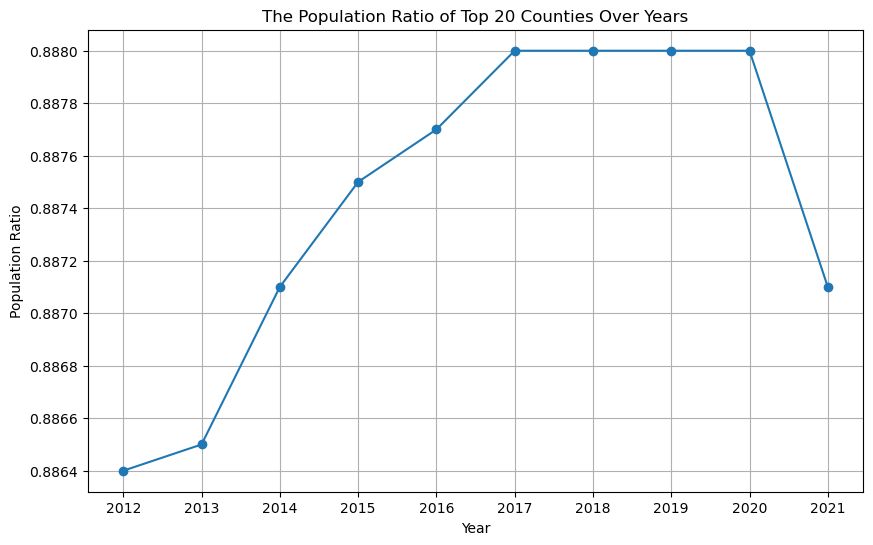

In [21]:
# Convert the 'year' column data type to integer
result_df['year'] = result_df['year'].astype(int)

# Plotting the population ratio over years
plt.figure(figsize=(10, 6))  # Set the size of the figure
plt.plot(result_df['year'], result_df['population_ratio'], marker='o')  # Plot with circle markers at data points
plt.title('The Population Ratio of Top 20 Counties Over Years')  # Set the title of the chart
plt.xlabel('Year')  # Set the label for the x-axis
plt.ylabel('Population Ratio')  # Set the label for the y-axis
plt.xticks(result_df['year'])  # Ensure every year is marked on the x-axis
plt.grid(True)  # Display grid lines for better readability
plt.show()  # Display the plot

In [22]:
seleced_counties = [' Los Angeles County',
 ' San Diego County',
 ' Orange County',
 ' Riverside County',
 ' San Bernardino County',
 ' Santa Clara County',
 ' Alameda County',
 ' Sacramento County',
 ' Contra Costa County',
 ' Fresno County',
 ' Kern County',
 ' San Francisco County',
 ' Ventura County',
 ' San Joaquin County',
 ' San Mateo County',
 ' Stanislaus County',
 ' Sonoma County',
 ' Tulare County',
 ' Solano County',
 ' Santa Barbara County']

In [23]:
gini_pivot_table = pd.pivot_table(acs_ca_filters[acs_ca_filters['county_name'].isin(seleced_counties)], values='gini_index', index=['county_name'], columns=['year'])
gini_pivot_table

year,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
county_name,,,,,,,,,,
Alameda County,0.4065,0.4126,0.4157,0.4171,0.4183,0.4175,0.4156,0.4170,0.4163,0.4194
Contra Costa County,0.3977,0.4010,0.4012,0.4055,0.4052,0.4071,0.4078,0.4067,0.4000,0.4023
Fresno County,0.4118,0.4144,0.4176,0.4200,0.4253,0.4256,0.4242,0.4243,0.4214,0.4218
Kern County,0.4066,0.4084,0.4088,0.4118,0.4132,0.4152,0.4168,0.4185,0.4034,0.4014
Los Angeles County,0.4184,0.4207,0.4233,0.4266,0.4298,0.4310,0.4310,0.4314,0.4311,0.4320
Orange County,0.4033,0.4063,0.4098,0.4129,0.4146,0.4155,0.4180,0.4177,0.4166,0.4190
Riverside County,0.3932,0.3962,0.4006,0.4023,0.4053,0.4093,0.4121,0.4131,0.4075,0.4064
Sacramento County,0.3956,0.4030,0.4089,0.4131,0.4170,0.4174,0.4162,0.4125,0.4072,0.4046
San Bernardino County,0.3904,0.3942,0.3983,0.4025,0.4051,0.4039,0.4032,0.4017,0.3955,0.3963


# 05.Data Visualization by Matplolib, Seaborn

>hist figure to show the **mean** gini index distribution over year in selected counties(Top 20 Counties)

we can found the significant 'outlier' is San Francisco county, with the higher gini index comparing to other top 15 counties in CA

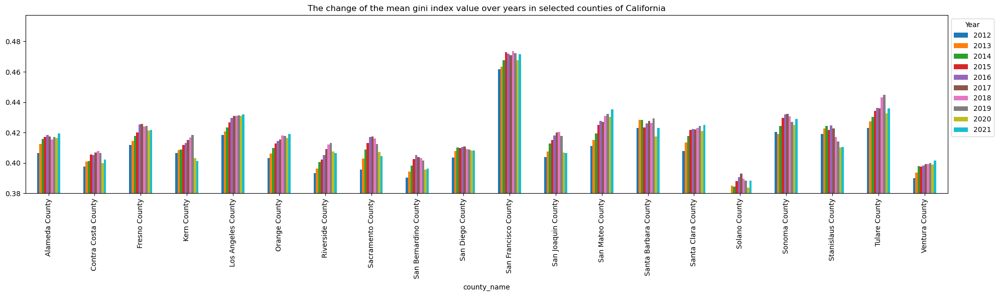

In [24]:
ax = gini_pivot_table.plot(
                            kind='bar', 
                            figsize=(20,6),
                            title='The change of the mean gini index value over years in selected counties of California')

ax.legend(title='Year', bbox_to_anchor=(1, 1), loc='upper left')
ax.set_ylim([0.38, None])

plt.tight_layout()
plt.show()

>kdeplot to show all of gini index distribution over year in top 20 counties of California

The above figure only showed the mean gini index in top 20 counties in CA, however, the below figure presented the all of index over 10 years, aiming to observe whether there is difference. And the result still tell us the San Francisco county is the 'outlier', which has significant rightward trend in the distribution. I guess this is the result of different population compositions.

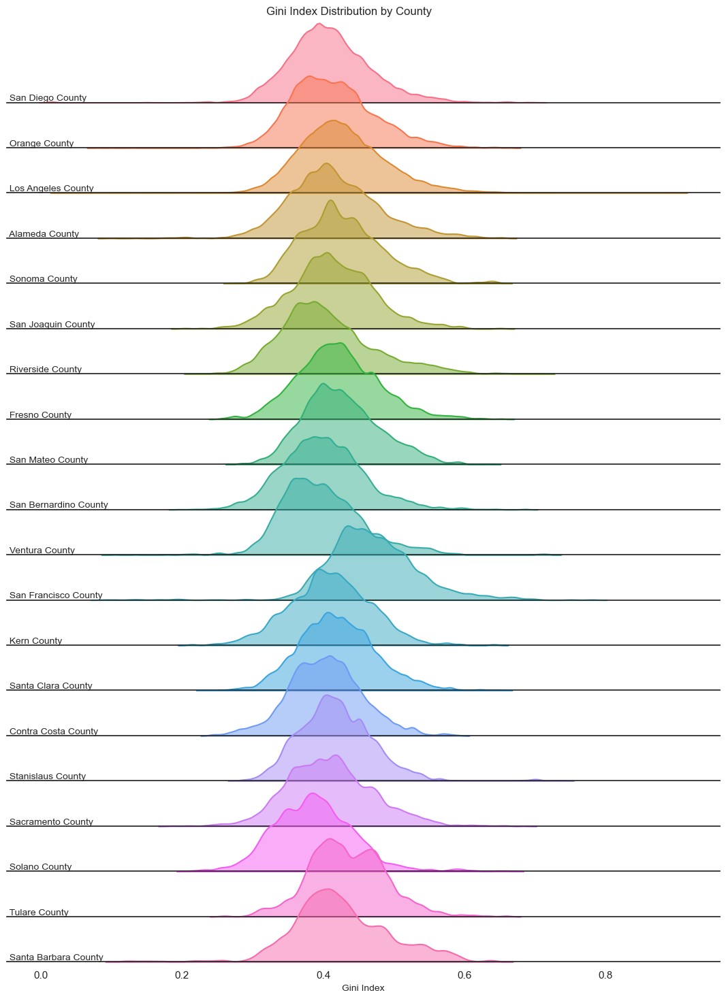

In [25]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style="white", rc={"axes.facecolor": (0, 0, 0, 0)})

# Create FacetGrid object
g = sns.FacetGrid(acs_ca_filters[acs_ca_filters['county_name'].isin(seleced_counties)], 
                  row="county_name", 
                  hue="county_name", 
                  aspect=15, 
                  height=.75)

# Create the KDE plot
g.map(sns.kdeplot, "gini_index",
      bw_adjust=.5, clip_on=False,
      fill=True, alpha=.5, linewidth=1.5)

# Adjust the space between the plots
g.figure.subplots_adjust(hspace=-0.5)

# Remove the yticks and despine
g.set(yticks=[])
g.despine(left=True)

# Set the x-axis label
g.set_axis_labels("Gini Index", fontsize=10)

# Set the title for each plot based on the actual order in the FacetGrid
for ax, name in zip(g.axes.flat, g.row_names):
    ax.set_title("")  # Clear the autogenerated title
    ax.set_ylabel(name, fontsize=10, rotation=0, loc='bottom', labelpad=0)  # Set the ylabel to county name

# Add an overall title for the figure
g.fig.suptitle('Gini Index Distribution by County', fontsize=12)

plt.show()


>Then, I want to make a case study, only focus on San Francisco County, Pairplot Map to show the relationship between gini index and factors in San Fransisco

Then, I use pairplot to explore the potential correlation between demographic data with gini index, and we can easily find the white, asian people percentage, bachelor higher degree and high school below degree has
a significant relationship with gini index.

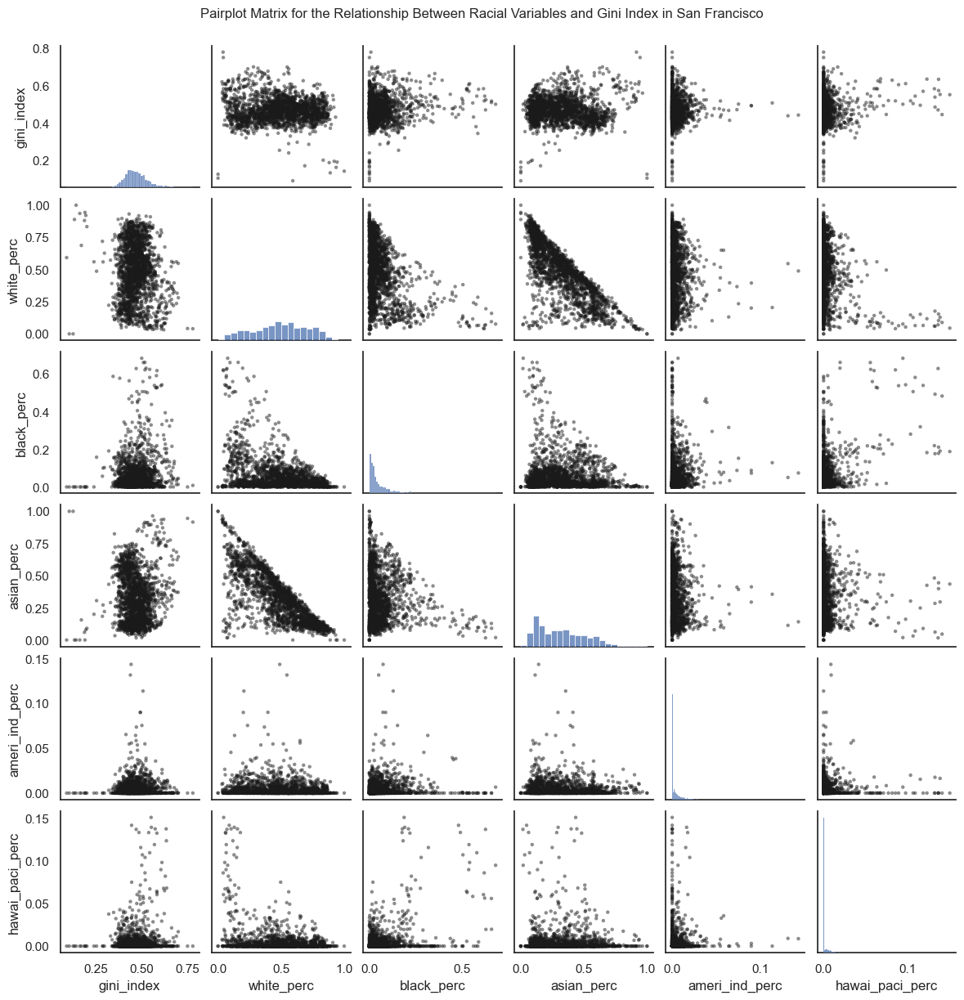

In [28]:
# Filter for San Francisco County
data_sf = acs_ca_filters[acs_ca_filters['county_name'] == ' San Francisco County']
columns = ['gini_index', 'white_perc', 'black_perc', 'asian_perc', 'ameri_ind_perc', 'hawai_paci_perc']

# Create a pairplot with adjusted plot_kws for regplot
g = sns.pairplot(data_sf[columns], 
                 plot_kws={'alpha': 0.5, 's': 10, 'edgecolor': 'none', 'facecolor': 'k'},
                 height=2, aspect=1)

# Add the title
plt.suptitle('Pairplot Matrix for the Relationship Between Racial Variables and Gini Index in San Francisco', size=12, y=1.02)
plt.show()


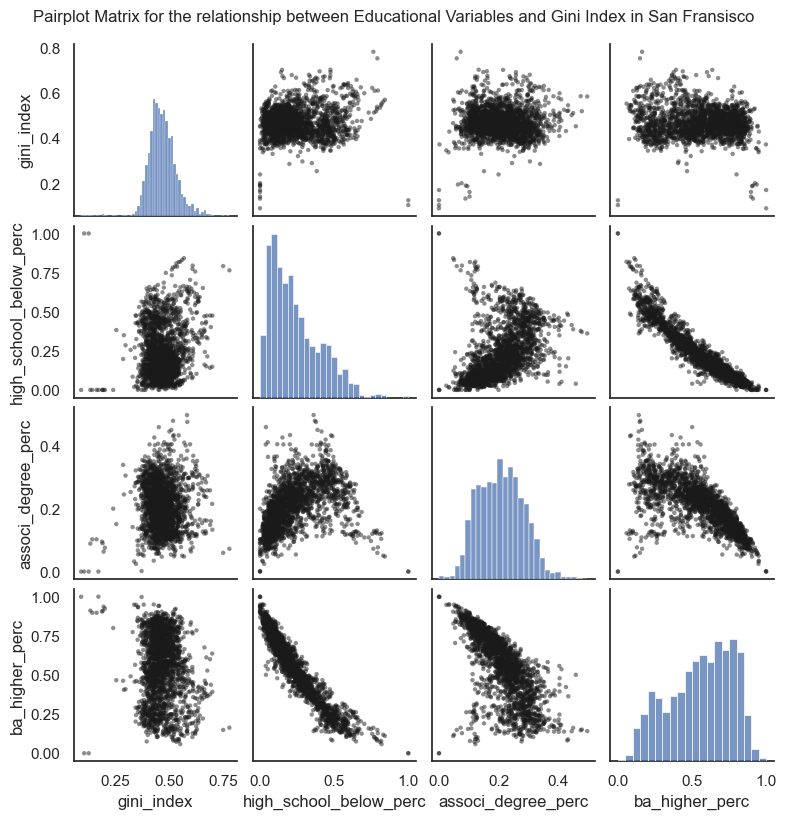

In [30]:
# Filter for San Francisco County
data_sf = acs_ca_filters[acs_ca_filters['county_name'] == ' San Francisco County']
columns = ['gini_index','high_school_below_perc', 'associ_degree_perc', 'ba_higher_perc']

# Create a pairplot with adjusted plot_kws for regplot
g = sns.pairplot(data_sf[columns], 
                 plot_kws={'alpha': 0.5, 's': 10, 'edgecolor': 'none', 'facecolor': 'k'},
                 height=2, aspect=1)

# Add the title
plt.suptitle('Pairplot Matrix for the relationship between Educational Variables and Gini Index in San Fransisco', size=12, y=1.02)
plt.show()


In [31]:
sf_test = acs_ca_filters[acs_ca_filters['county_name'] == ' San Francisco County']

In San Francisco County, it has been observed that over the past decade, as the proportion of individuals with a bachelor's degree or higher increases, the Gini index has been gradually decreasing.

In [32]:
import plotly
import plotly.express as px

df = px.data.gapminder() 
fig = px.scatter(
    sf_test, x="ba_higher_perc", y="gini_index", animation_frame="year", animation_group="tract",
       size="total_pop", color="county_name", hover_name="tract",
       size_max=20, range_x=[0,1], range_y=[0,1], trendline="ols",width=1000, height=600)

fig.update_layout(title="The correlation between bachelor higher percentage and gini index in San Fransisco County over years",)

fig.show()

In [53]:
# print(plotly.offline.plot(fig, include_plotlyjs='cdn', output_type='div'))

In [34]:
import plotly
import plotly.express as px

df = px.data.gapminder() 
fig = px.scatter(
    sf_test, x="associ_degree_perc", y="gini_index", animation_frame="year", animation_group="tract",
       size="total_pop", color="county_name", hover_name="tract",
       size_max=20, range_x=[0,1], range_y=[0,1], trendline="ols",width=1000, height=600,color_discrete_sequence=['orange'])

fig.update_layout(title="The correlation between associate degree percentage and gini index in San Fransisco County over years",)

fig.show()

In [52]:
# print(plotly.offline.plot(fig, include_plotlyjs='cdn', output_type='div'))

In [36]:
import plotly
import plotly.express as px

df = px.data.gapminder() 
fig = px.scatter(
    sf_test, x="high_school_below_perc", y="gini_index", animation_frame="year", animation_group="tract",
       size="total_pop", color="county_name", hover_name="tract",
       size_max=20, range_x=[0,1], range_y=[0,1], trendline="ols",width=1000, height=600,color_discrete_sequence=['orange'])

fig.update_layout(title="The correlation between high school and below percentage and gini index in San Fransisco County over years",)

fig.show()

In [51]:
# print(plotly.offline.plot(fig, include_plotlyjs='cdn', output_type='div'))

In San Francisco County, it has been observed that over the past decade, as the percentage of white people increases, the Gini index exhibits an unstable trend of changes, first decreasing and then increasing.

In [38]:
import plotly
import plotly.express as px

df = px.data.gapminder() 
fig = px.scatter(
    sf_test, x="white_perc", y="gini_index", animation_frame="year", animation_group="tract",
       size="total_pop", color="county_name", hover_name="tract",
       size_max=20, range_x=[0,1], range_y=[0,1], trendline="ols", width=1000, height=600, color_discrete_sequence=['red'])

fig.update_layout(title="The correlation between white people percentage and gini index in San Fransisco County over years")

fig.show()

In [50]:
# print(plotly.offline.plot(fig, include_plotlyjs='cdn', output_type='div'))

In [40]:
import plotly
import plotly.express as px

df = px.data.gapminder() 
fig = px.scatter(
    sf_test, x="asian_perc", y="gini_index", animation_frame="year", animation_group="tract",
       size="total_pop", color="county_name", hover_name="tract",
       size_max=20, range_x=[0,1], range_y=[0,1], trendline="ols", width=1000, height=600, color_discrete_sequence=['green'])

fig.update_layout(title="The correlation between asian people percentage and gini index in San Fransisco County over years")

fig.show()

In [49]:
# print(plotly.offline.plot(fig, include_plotlyjs='cdn', output_type='div'))

# 06.The Details of Visualization

First of all, we should merge geo boudary for dataset within each year, thus, we rely on API from [Tiger Line](https://www2.census.gov/geo/tiger/TIGER2021/TRACT/) website.

In [42]:
geo_2012 = gpd.read_file('https://www2.census.gov/geo/tiger/TIGER2012/TRACT/tl_2012_06_tract.zip')
geo_2013 = gpd.read_file('https://www2.census.gov/geo/tiger/TIGER2013/TRACT/tl_2013_06_tract.zip')
geo_2014 = gpd.read_file('https://www2.census.gov/geo/tiger/TIGER2014/TRACT/tl_2014_06_tract.zip')
geo_2015 = gpd.read_file('https://www2.census.gov/geo/tiger/TIGER2015/TRACT/tl_2015_06_tract.zip')
geo_2016 = gpd.read_file('https://www2.census.gov/geo/tiger/TIGER2016/TRACT/tl_2016_06_tract.zip')
geo_2017 = gpd.read_file('https://www2.census.gov/geo/tiger/TIGER2017/TRACT/tl_2017_06_tract.zip')
geo_2018 = gpd.read_file('https://www2.census.gov/geo/tiger/TIGER2018/TRACT/tl_2018_06_tract.zip')
geo_2019 = gpd.read_file('https://www2.census.gov/geo/tiger/TIGER2019/TRACT/tl_2019_06_tract.zip')
geo_2020 = gpd.read_file('https://www2.census.gov/geo/tiger/TIGER2020/TRACT/tl_2020_06_tract.zip')
geo_2021 = gpd.read_file('https://www2.census.gov/geo/tiger/TIGER2021/TRACT/tl_2021_06_tract.zip')

outlines = gpd.read_file('https://www2.census.gov/geo/tiger/GENZ2016/shp/cb_2016_us_state_500k.zip')
outlines = outlines[outlines['GEOID'] == '06'] 

# clip tract geoms to coastline
geo_2012 = geo_2012.clip(outlines)
geo_2013 = geo_2013.clip(outlines)
geo_2014 = geo_2014.clip(outlines)
geo_2015 = geo_2015.clip(outlines)
geo_2016 = geo_2016.clip(outlines)
geo_2017 = geo_2017.clip(outlines)
geo_2018 = geo_2018.clip(outlines)
geo_2019 = geo_2019.clip(outlines)
geo_2020 = geo_2020.clip(outlines)
geo_2021 = geo_2021.clip(outlines)

# merge data
sf_test_geo_2012 = geo_2012[['GEOID','geometry']].merge(sf_test[sf_test['year'] == 2012], left_on='GEOID', right_on='GEO_ID', how='right')
sf_test_geo_2013 = geo_2013[['GEOID','geometry']].merge(sf_test[sf_test['year'] == 2013], left_on='GEOID', right_on='GEO_ID', how='right')
sf_test_geo_2014 = geo_2014[['GEOID','geometry']].merge(sf_test[sf_test['year'] == 2014], left_on='GEOID', right_on='GEO_ID', how='right')
sf_test_geo_2015 = geo_2015[['GEOID','geometry']].merge(sf_test[sf_test['year'] == 2015], left_on='GEOID', right_on='GEO_ID', how='right')
sf_test_geo_2016 = geo_2016[['GEOID','geometry']].merge(sf_test[sf_test['year'] == 2016], left_on='GEOID', right_on='GEO_ID', how='right')
sf_test_geo_2017 = geo_2017[['GEOID','geometry']].merge(sf_test[sf_test['year'] == 2017], left_on='GEOID', right_on='GEO_ID', how='right')
sf_test_geo_2018 = geo_2018[['GEOID','geometry']].merge(sf_test[sf_test['year'] == 2018], left_on='GEOID', right_on='GEO_ID', how='right')
sf_test_geo_2019 = geo_2019[['GEOID','geometry']].merge(sf_test[sf_test['year'] == 2019], left_on='GEOID', right_on='GEO_ID', how='right')
sf_test_geo_2020 = geo_2020[['GEOID','geometry']].merge(sf_test[sf_test['year'] == 2020], left_on='GEOID', right_on='GEO_ID', how='right')
sf_test_geo_2021 = geo_2021[['GEOID','geometry']].merge(sf_test[sf_test['year'] == 2021], left_on='GEOID', right_on='GEO_ID', how='right')

# save polygon geometry
sf_test_geo_2012 = sf_test_geo_2012[sf_test_geo_2012.geometry.type == 'Polygon']
sf_test_geo_2013 = sf_test_geo_2013[sf_test_geo_2013.geometry.type == 'Polygon']
sf_test_geo_2014 = sf_test_geo_2014[sf_test_geo_2014.geometry.type == 'Polygon']
sf_test_geo_2015 = sf_test_geo_2015[sf_test_geo_2015.geometry.type == 'Polygon']
sf_test_geo_2016 = sf_test_geo_2016[sf_test_geo_2016.geometry.type == 'Polygon']
sf_test_geo_2017 = sf_test_geo_2017[sf_test_geo_2017.geometry.type == 'Polygon']
sf_test_geo_2018 = sf_test_geo_2018[sf_test_geo_2018.geometry.type == 'Polygon']
sf_test_geo_2019 = sf_test_geo_2019[sf_test_geo_2019.geometry.type == 'Polygon']
sf_test_geo_2020 = sf_test_geo_2020[sf_test_geo_2020.geometry.type == 'Polygon']
sf_test_geo_2021 = sf_test_geo_2021[sf_test_geo_2021.geometry.type == 'Polygon']

In [43]:
from tobler.util import h3fy
from tobler.area_weighted import area_interpolate

In [44]:
def process_yearly_data(sf_test_geo, year, resolution=9):
    # Check if the CRS matches, if not reproject
    desired_crs = 'EPSG:4326'  # Set your desired CRS here
    if sf_test_geo.crs != desired_crs:
        sf_test_geo = sf_test_geo.to_crs(desired_crs)
    
    # transfer census boundary into hexbins
    hexes = h3fy(sf_test_geo, resolution=resolution, clip=True)
    hexes = hexes.reset_index()
    
    # Ensure hexes is in the same CRS as sf_test_geo
    if hexes.crs != sf_test_geo.crs:
        hexes = hexes.to_crs(sf_test_geo.crs)
    
    # spatial join to match data
    hexes_test = gpd.sjoin(hexes, sf_test_geo, how='left')
    
    # calculate the median aggregation data
    hexes_median = hexes_test.groupby('hex_id')[['total_pop', 'white_perc', 'black_perc', 'asian_perc', 'ameri_ind_perc', 'hawai_paci_perc', 'high_school_below_perc', 'associ_degree_perc', 'ba_higher_perc', 'gini_index', 'year']].quantile(0.5)
    hexes_median['year'] = hexes_median['year'].astype(int)
    
    # merge data together
    hexes = hexes.merge(hexes_median, on='hex_id')
    
    return hexes


In [45]:
hexes_2012 = process_yearly_data(sf_test_geo_2012, 2012)
hexes_2013 = process_yearly_data(sf_test_geo_2013, 2013)
hexes_2014 = process_yearly_data(sf_test_geo_2014, 2014)
hexes_2015 = process_yearly_data(sf_test_geo_2015, 2015)
hexes_2016 = process_yearly_data(sf_test_geo_2016, 2016)
hexes_2017 = process_yearly_data(sf_test_geo_2017, 2017)
hexes_2018 = process_yearly_data(sf_test_geo_2018, 2018)
hexes_2019 = process_yearly_data(sf_test_geo_2019, 2019)
hexes_2020 = process_yearly_data(sf_test_geo_2020, 2020)
hexes_2021 = process_yearly_data(sf_test_geo_2021, 2021)

In [46]:
# List of all the dataframes to concatenate
frames = [hexes_2012, hexes_2013, hexes_2014, hexes_2015,
          hexes_2016, hexes_2017, hexes_2018, hexes_2019,
          hexes_2020, hexes_2021]
# Concatenate all the dataframes
sf_test_geo = pd.concat(frames, ignore_index=True)

In [47]:
sf_test_geo = sf_test_geo.to_crs(epsg=3857)

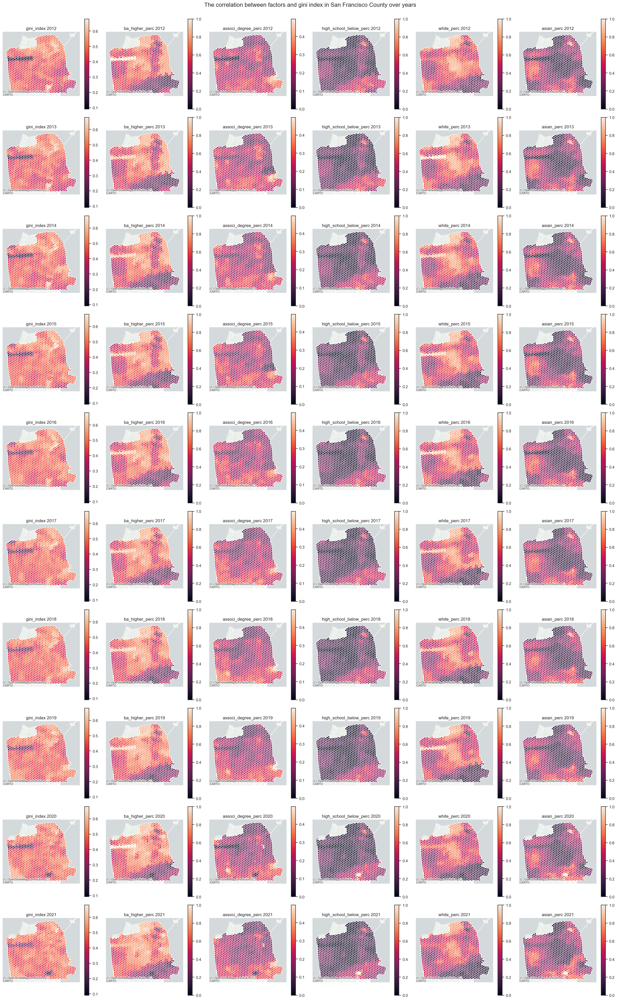

In [48]:
import matplotlib.pyplot as plt
import contextily as cx  # Ensure the contextily library is installed for basemap addition
import geopandas as gpd

# Set up the subplot configuration: 10 rows by 5 columns, with each subplot having a size of 20x40 inches
fig, axes = plt.subplots(nrows=10, ncols=6, figsize=(24, 40))

# Define the columns of interest and their respective color scales
columns = ['gini_index', 'ba_higher_perc', 'associ_degree_perc', 'high_school_below_perc', 'white_perc', 'asian_perc']
years = range(2012, 2022)

# Compute global minimum and maximum values for each column to maintain a consistent color range across all plots
vmin_vmax = {col: (sf_test_geo[col].min(), sf_test_geo[col].max()) for col in columns}

# Loop through each year and column to plot the geographical data
for i, year in enumerate(years):
    # Filter the data for the current year
    data_for_year = sf_test_geo[sf_test_geo['year'] == year]
    
    for j, col in enumerate(columns):
        ax = axes[i, j]
        # Plot the map ensuring color scale consistency
        data_for_year.plot(column=col, ax=ax, legend=True,
                           vmin=vmin_vmax[col][0], vmax=vmin_vmax[col][1])
        # Add a basemap using contextily with the CartoDB.Positron style
        cx.add_basemap(ax, source=cx.providers.CartoDB.Positron)
        # Set the title for each subplot indicating the column and year
        ax.set_title(f'{col} {year}')
        # Turn off axis visibility for a cleaner look
        ax.axis('off')

# Adjust the layout to prevent the overlap of subplot titles and the overall title
fig.subplots_adjust(top=0.95)
plt.tight_layout(rect=[0, 0, 1, 0.95])

# Set a main title with a slight adjustment to its top margin for better placement
fig.suptitle('The correlation between factors and gini index in San Francisco County over years', fontsize=16, y=0.96)

# Display the completed plot
plt.show()

# 07.Brief Conclusion

>This study investigates the distribution of income inequality across different geographic areas in California and explores the relationship between demographic characteristics and income inequality. Utilizing the American Community Survey (ACS) five-year data from 2012 to 2021, with census tracts as the smallest unit of analysis, the research aims to deepen the understanding of the interactions between these variables and income inequality. Notably, the study identifies San Francisco County as a significant outlier with a higher Gini index compared to other top 15 counties in California. This finding is further confirmed by observing the distribution of all Gini indices over the decade, indicating a significant rightward trend in San Francisco County. Pairplot analysis of demographic data and the Gini index reveals a significant relationship between educational level, the percentage of white individuals, and income inequality. In San Francisco County, it has been observed that as the proportion of individuals with at least a bachelor's degree increases, the Gini index gradually decreases. However, the trend of the Gini index in response to an increasing percentage of white people first decreases and then increases, showing an unstable pattern. These findings provide insightful understandings of how various factors affect income inequality across regions.